In [1]:
import os
import torchaudio
import torch
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd

## Loading audio files with Librosa

In [2]:
scale_file = "audio/scale.wav"
debussy_file = "audio/debussy.wav"
redhot_file = "audio/redhot.wav"
duke_file = "audio/duke.wav"

In [3]:
ipd.Audio(scale_file)

In [4]:
ipd.Audio(debussy_file)

In [5]:
ipd.Audio(redhot_file)

In [6]:
ipd.Audio(duke_file)

In [9]:
FRAME_SIZE = 2048
HOP_SIZE = 512
hop_length = HOP_SIZE

## Visualizing the spectrogram

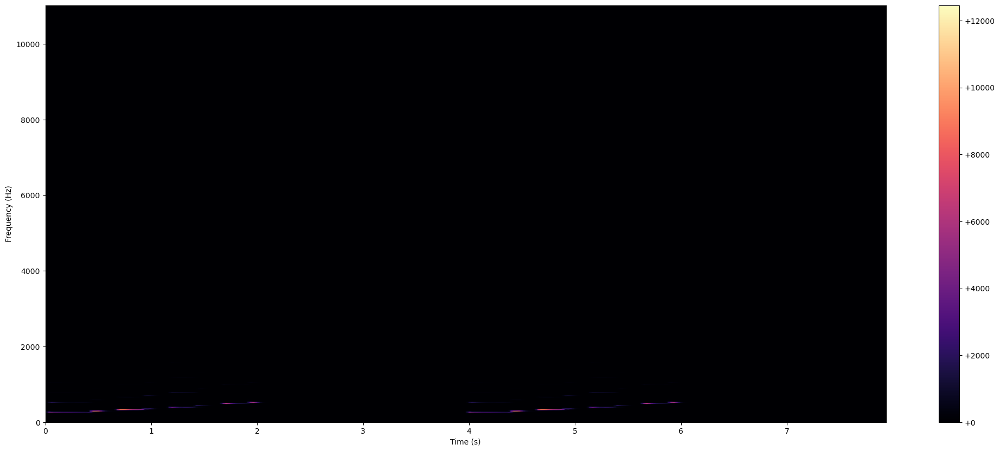

In [12]:
import torchaudio
sr=22050
scale_torchaudio, sr_torchaudio = torchaudio.load(scale_file)
scale_resampler = torchaudio.transforms.Resample(orig_freq=sr_torchaudio, new_freq=sr)
scale_torchaudio = scale_resampler(scale_torchaudio.mean(dim=0).unsqueeze(0))

sr_torchaudio = sr
sample_duration = 1 / sr_torchaudio
tot_samples = scale_torchaudio.size(1)
duration = sample_duration * tot_samples
stft_transform = torchaudio.transforms.Spectrogram(n_fft=FRAME_SIZE, hop_length=HOP_SIZE, pad_mode='constant')
Y_scale_torchaudio = stft_transform(scale_torchaudio).squeeze(0)
plt.figure(figsize=(25, 10))
plt.imshow(Y_scale_torchaudio, aspect='auto', origin='lower', cmap='magma', extent=(0, duration, 0, sr_torchaudio // 2))
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(format='%+2.f')
plt.show()

## Log-Amplitude Spectrogram
## Log-Frequency Spectrogram

In [13]:
spectrogram_transform = torchaudio.transforms.AmplitudeToDB(stype='power', top_db=80)
Y_log_scale_torchaudio = spectrogram_transform(Y_scale_torchaudio).squeeze(0)

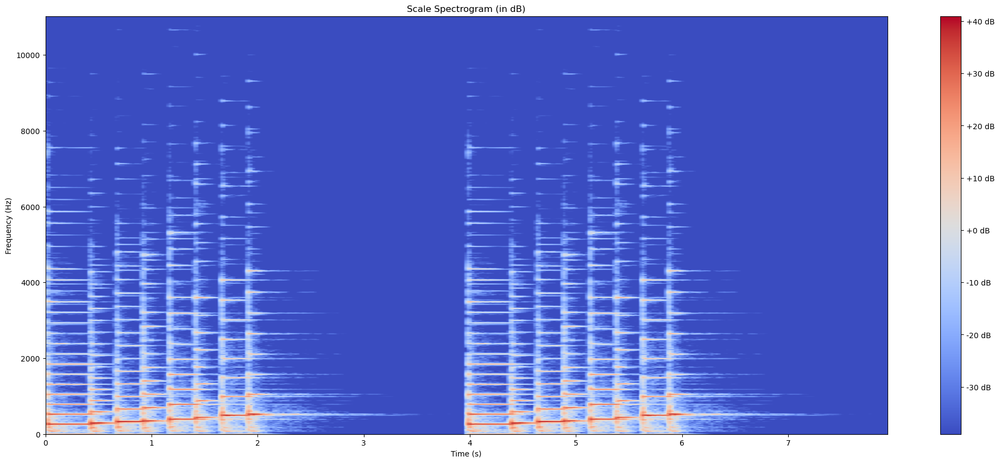

In [14]:
plt.figure(figsize=(25, 10))
plt.imshow(Y_log_scale_torchaudio, aspect='auto', origin='lower', cmap='coolwarm', extent=(0, duration, 0, sr_torchaudio / 2))
plt.colorbar(format='%+2.f dB')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Scale Spectrogram (in dB)')
plt.show()

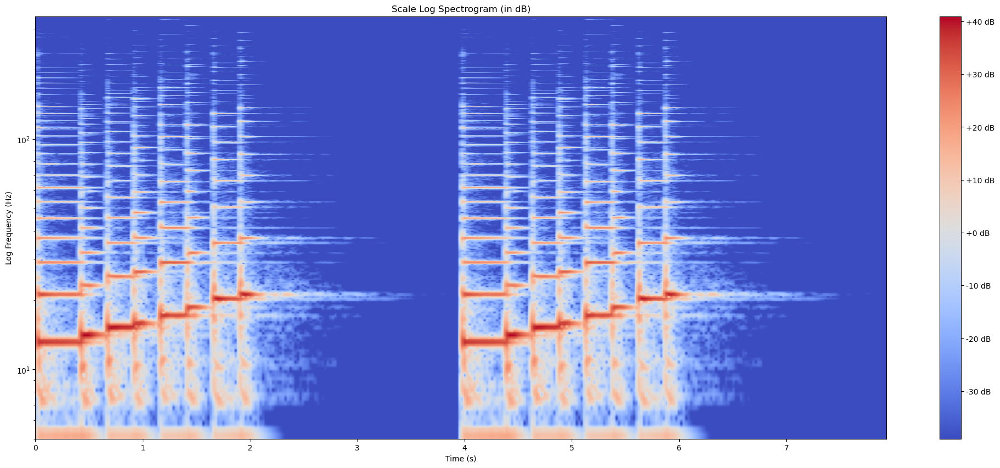

In [15]:
plt.figure(figsize=(25, 10))
plt.yscale('log')
plt.imshow(Y_log_scale_torchaudio, aspect='auto', origin='lower', cmap='coolwarm', extent=(0, duration, 5, Y_log_scale_torchaudio.size(1)))
plt.colorbar(format='%+2.f dB')
plt.xlabel('Time (s)')
plt.ylabel('Log Frequency (Hz)')
plt.title('Scale Log Spectrogram (in dB)')
plt.show()

## Visualising songs from different genres

In [16]:
debussy_torchaudio, _ = torchaudio.load(debussy_file)
redhot_torchaudio, _ = torchaudio.load(redhot_file)
duke_torchaudio, _ = torchaudio.load(duke_file)
tot_samples = debussy_torchaudio.size(1)
duration = 1 / sr_torchaudio * tot_samples
Y_debussy_torchaudio = stft_transform(debussy_torchaudio).squeeze(0)
Y_redhot_torchaudio = stft_transform(redhot_torchaudio).squeeze(0)
Y_duke_torchaudio = stft_transform(duke_torchaudio).squeeze(0)
Y_log_debussy_torchaudio = spectrogram_transform(Y_debussy_torchaudio).squeeze(0)
Y_log_redhot_torchaudio = spectrogram_transform(Y_redhot_torchaudio).squeeze(0)
Y_log_duke_torchaudio = spectrogram_transform(Y_duke_torchaudio).squeeze(0)

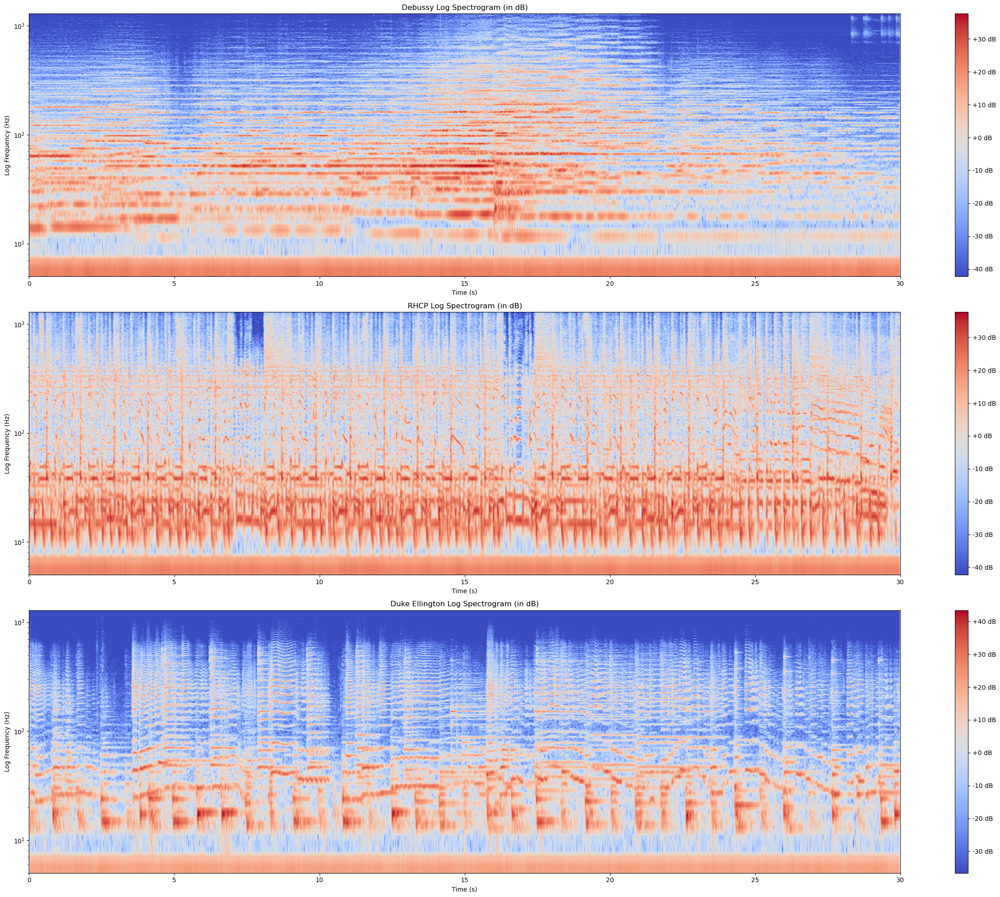

In [21]:
plt.figure(figsize=(25, 20))

# Debussy
plt.subplot(3, 1, 1)
plt.yscale('log')
plt.imshow(Y_log_debussy_torchaudio, aspect='auto', origin='lower', cmap='coolwarm', extent=(0, duration, 5, Y_log_debussy_torchaudio.size(1)))
plt.colorbar(format='%+2.f dB')
plt.title('Debussy Log Spectrogram (in dB)')
plt.xlabel('Time (s)')
plt.ylabel('Log Frequency (Hz)')

# Redhot
plt.subplot(3, 1, 2)
plt.yscale('log')
plt.imshow(Y_log_redhot_torchaudio, aspect='auto', origin='lower', cmap='coolwarm', extent=(0, duration, 5, Y_log_redhot_torchaudio.size(1)))
plt.colorbar(format='%+2.f dB')
plt.title('RHCP Log Spectrogram (in dB)')
plt.xlabel('Time (s)')
plt.ylabel('Log Frequency (Hz)')

# Duke
plt.subplot(3, 1, 3)
plt.yscale('log')
plt.imshow(Y_log_duke_torchaudio, aspect='auto', origin='lower', cmap='coolwarm', extent=(0, duration, 5, Y_log_duke_torchaudio.size(1)))
plt.colorbar(format='%+2.f dB')
plt.title('Duke Ellington Log Spectrogram (in dB)')
plt.xlabel('Time (s)')
plt.ylabel('Log Frequency (Hz)')

plt.tight_layout()
plt.show()